In [2]:
import os

# Check local dataset structure
print("Checking local dataset directory structure...\n")

base_path = "Dataset"  # update as needed if your root is different

for root, dirs, files in os.walk(base_path):
    level = root.replace(base_path, '').count(os.sep)
    indent = ' ' * 2 * level
    print(f"{indent}{os.path.basename(root)}/")
    
    # Only show first few levels to avoid too much output
    if level < 4:
        sub_indent = ' ' * 2 * (level + 1)
        for file in files[:5]:  # Show first 5 files
            print(f"{sub_indent}{file}")
        if len(files) > 5:
            print(f"{sub_indent}... and {len(files) - 5} more files")


Checking local dataset directory structure...



DISASTER CLASSIFICATION DATASET - EXPLORATION REPORT

📊 DATASET OVERVIEW
----------------------------------------------------------------------

1. PRE-SPLIT DATASET (train/test/validation)
----------------------------------------------------------------------
            cyclone  earthquake  flood  wildfire
train           400         400    400       400
test            100         100    100       100
validation      100         100    100       100

Total Images in Split Dataset: 2400

2. FULL ORIGINAL DATASET
----------------------------------------------------------------------
Cyclone     :   928 images
Earthquake  :  1350 images
Flood       :  1073 images
Wildfire    :  1077 images

Total Images in Full Dataset: 4428

3. SPLIT DISTRIBUTION (Pre-split Dataset)
----------------------------------------------------------------------
Train       :  1600 images (66.67%)
Test        :   400 images (16.67%)
Validation  :   400 images (16.67%)

4. CLASS BALANCE (Pre-split Dataset)
-----

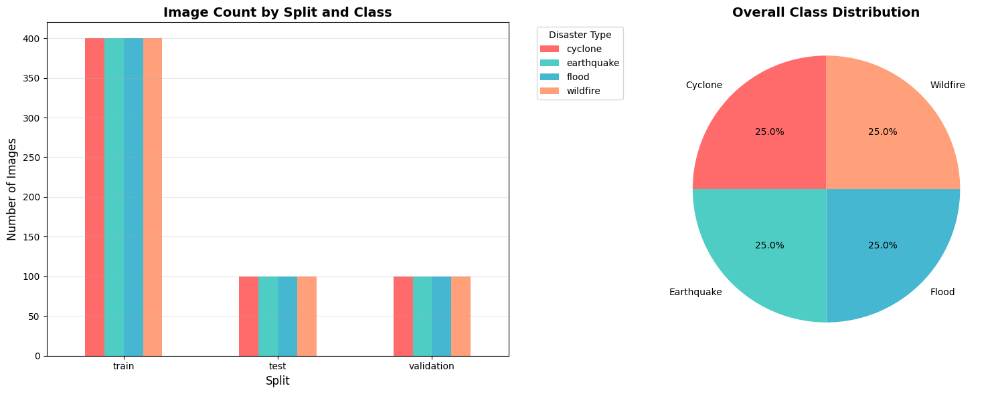

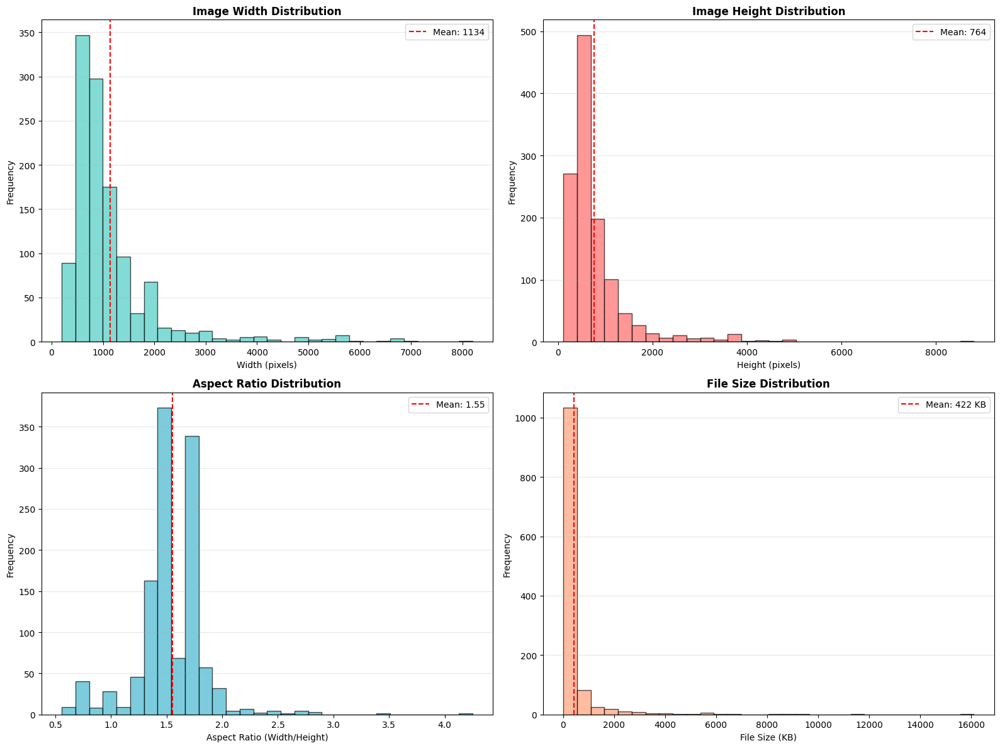

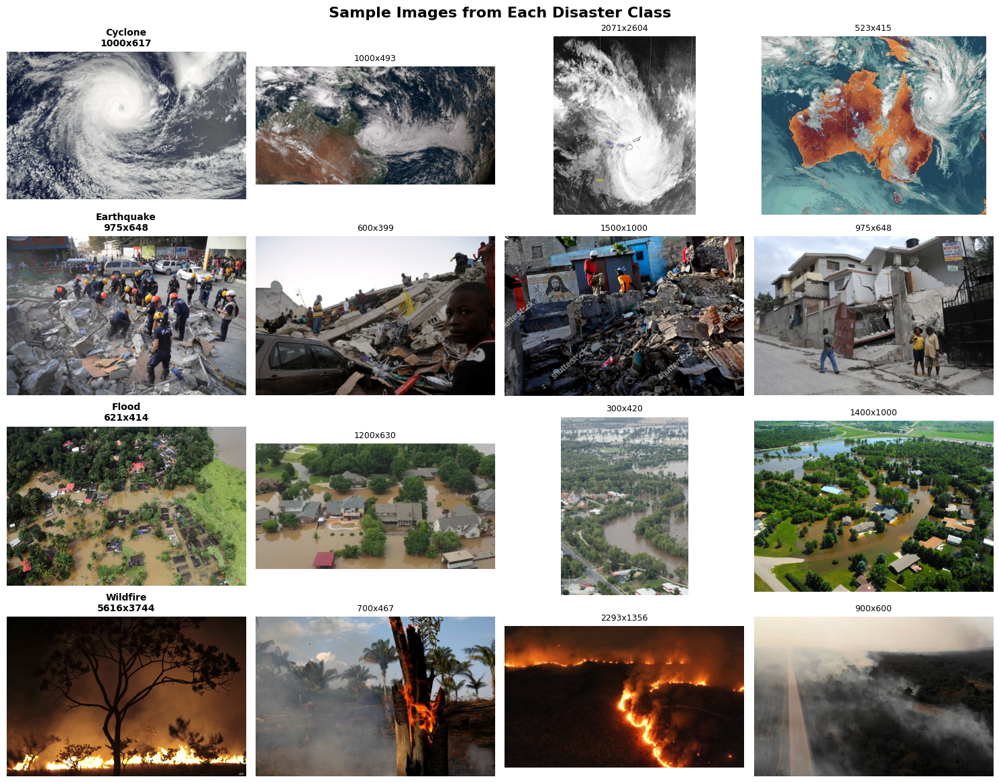


✅ DATA EXPLORATION COMPLETE!

📊 Generated Files:
  - class_distribution.png
  - image_properties.png
  - sample_images.png

💡 KEY INSIGHTS:
  • Total dataset size: 4,428 images
  • Pre-split dataset: 2,400 images
  • Training set: 1600 images (66.7%)
  • Classes: 4 (Cyclone, Earthquake, Flood, Wildfire)
  • Avg image size: 1134x764 pixels
  • Avg file size: 422.3 KB


In [8]:
import os
import numpy as np
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
from collections import Counter

# LOCAL paths
BASE_PATH = "../Dataset"
FULL_DATASET_PATH = os.path.join(BASE_PATH, "Cyclone_Wildfire_Flood_Earthquake_Dataset")

SPLIT_PATH = BASE_PATH  # 'train', 'validation', 'test' are subfolders here
SPLITS = ['train', 'test', 'validation']
CLASSES = ['cyclone', 'earthquake', 'flood', 'wildfire']

# ---- Functions below use these paths! ----

def count_images():
    split_results = {}
    for split in SPLITS:
        split_results[split] = {}
        for cls in CLASSES:
            path = os.path.join(SPLIT_PATH, split, cls)
            if os.path.exists(path):
                count = len([f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
                split_results[split][cls] = count
            else:
                split_results[split][cls] = 0

    full_results = {}
    for cls in CLASSES:
        cls_capitalized = cls.capitalize()
        path = os.path.join(FULL_DATASET_PATH, cls_capitalized)
        if os.path.exists(path):
            count = len([f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))])
            full_results[cls] = count
        else:
            full_results[cls] = 0

    return split_results, full_results

def analyze_image_properties(sample_size=100):
    properties = {
        'dimensions': [],
        'formats': [],
        'file_sizes': [],
        'aspect_ratios': [],
        'widths': [],
        'heights': []
    }
    for split in SPLITS:
        for cls in CLASSES:
            path = os.path.join(SPLIT_PATH, split, cls)
            if not os.path.exists(path):
                continue
            images = [f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
            sample = images[:min(sample_size, len(images))]
            for img_name in sample:
                img_path = os.path.join(path, img_name)
                try:
                    file_size = os.path.getsize(img_path) / 1024  # KB
                    properties['file_sizes'].append(file_size)
                    img = Image.open(img_path)
                    properties['dimensions'].append(img.size)
                    properties['formats'].append(img.format)
                    properties['widths'].append(img.size[0])
                    properties['heights'].append(img.size[1])
                    aspect_ratio = img.size[0] / img.size[1]
                    properties['aspect_ratios'].append(aspect_ratio)
                except Exception as e:
                    print(f"Error processing {img_path}: {e}")
    return properties

def check_corrupted_images():
    corrupted = []
    for split in SPLITS:
        for cls in CLASSES:
            path = os.path.join(SPLIT_PATH, split, cls)
            if not os.path.exists(path):
                continue
            images = [f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
            for img_name in images:
                img_path = os.path.join(path, img_name)
                try:
                    img = Image.open(img_path)
                    img.verify()
                except Exception as e:
                    corrupted.append({'path': img_path, 'error': str(e)})
    return corrupted

def visualize_samples(samples_per_class=3):
    fig, axes = plt.subplots(len(CLASSES), samples_per_class, figsize=(15, 12))
    fig.suptitle('Sample Images from Each Disaster Class', fontsize=16, fontweight='bold')
    for i, cls in enumerate(CLASSES):
        path = os.path.join(SPLIT_PATH, 'train', cls)
        if os.path.exists(path):
            images = [f for f in os.listdir(path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp'))]
            for j in range(min(samples_per_class, len(images))):
                img_path = os.path.join(path, images[j])
                img = Image.open(img_path)
                axes[i, j].imshow(img)
                axes[i, j].axis('off')
                if j == 0:
                    axes[i, j].set_title(f"{cls.capitalize()}\n{img.size[0]}x{img.size[1]}", fontweight='bold', fontsize=10)
                else:
                    axes[i, j].set_title(f"{img.size[0]}x{img.size[1]}", fontsize=9)
    plt.tight_layout()
    plt.savefig('sample_images.png', dpi=150, bbox_inches='tight')
    plt.show()

def plot_class_distribution(counts):
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    df_counts = pd.DataFrame(counts).T
    df_counts.plot(kind='bar', stacked=False, ax=axes[0], color=['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A'])
    axes[0].set_title('Image Count by Split and Class', fontsize=14, fontweight='bold')
    axes[0].set_xlabel('Split', fontsize=12)
    axes[0].set_ylabel('Number of Images', fontsize=12)
    axes[0].legend(title='Disaster Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[0].grid(axis='y', alpha=0.3)
    axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=0)
    class_totals = {}
    for cls in CLASSES:
        class_totals[cls] = sum([counts[split][cls] for split in SPLITS])
    colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#FFA07A']
    axes[1].pie(class_totals.values(), labels=[c.capitalize() for c in class_totals.keys()],
                autopct='%1.1f%%', startangle=90, colors=colors)
    axes[1].set_title('Overall Class Distribution', fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.savefig('class_distribution.png', dpi=150, bbox_inches='tight')
    plt.show()

def plot_image_properties(properties):
    fig, axes = plt.subplots(2, 2, figsize=(16, 12))
    axes[0, 0].hist(properties['widths'], bins=30, color='#4ECDC4', edgecolor='black', alpha=0.7)
    axes[0, 0].set_title('Image Width Distribution', fontsize=12, fontweight='bold')
    axes[0, 0].set_xlabel('Width (pixels)')
    axes[0, 0].set_ylabel('Frequency')
    axes[0, 0].grid(axis='y', alpha=0.3)
    axes[0, 0].axvline(np.mean(properties['widths']), color='red', linestyle='--',
                      label=f"Mean: {np.mean(properties['widths']):.0f}")
    axes[0, 0].legend()
    axes[0, 1].hist(properties['heights'], bins=30, color='#FF6B6B', edgecolor='black', alpha=0.7)
    axes[0, 1].set_title('Image Height Distribution', fontsize=12, fontweight='bold')
    axes[0, 1].set_xlabel('Height (pixels)')
    axes[0, 1].set_ylabel('Frequency')
    axes[0, 1].grid(axis='y', alpha=0.3)
    axes[0, 1].axvline(np.mean(properties['heights']), color='red', linestyle='--',
                      label=f"Mean: {np.mean(properties['heights']):.0f}")
    axes[0, 1].legend()
    axes[1, 0].hist(properties['aspect_ratios'], bins=30, color='#45B7D1', edgecolor='black', alpha=0.7)
    axes[1, 0].set_title('Aspect Ratio Distribution', fontsize=12, fontweight='bold')
    axes[1, 0].set_xlabel('Aspect Ratio (Width/Height)')
    axes[1, 0].set_ylabel('Frequency')
    axes[1, 0].grid(axis='y', alpha=0.3)
    axes[1, 0].axvline(np.mean(properties['aspect_ratios']), color='red', linestyle='--',
                      label=f"Mean: {np.mean(properties['aspect_ratios']):.2f}")
    axes[1, 0].legend()
    axes[1, 1].hist(properties['file_sizes'], bins=30, color='#FFA07A', edgecolor='black', alpha=0.7)
    axes[1, 1].set_title('File Size Distribution', fontsize=12, fontweight='bold')
    axes[1, 1].set_xlabel('File Size (KB)')
    axes[1, 1].set_ylabel('Frequency')
    axes[1, 1].grid(axis='y', alpha=0.3)
    axes[1, 1].axvline(np.mean(properties['file_sizes']), color='red', linestyle='--',
                      label=f"Mean: {np.mean(properties['file_sizes']):.0f} KB")
    axes[1, 1].legend()
    plt.tight_layout()
    plt.savefig('image_properties.png', dpi=150, bbox_inches='tight')
    plt.show()

def generate_summary():
    print("="*70)
    print("DISASTER CLASSIFICATION DATASET - EXPLORATION REPORT")
    print("="*70)
    print("\n📊 DATASET OVERVIEW")
    print("-"*70)
    split_counts, full_counts = count_images()
    print("\n1. PRE-SPLIT DATASET (train/test/validation)")
    print("-"*70)
    df_counts = pd.DataFrame(split_counts).T
    print(df_counts.to_string())
    total_split = sum([sum(split_counts[split].values()) for split in SPLITS])
    print(f"\nTotal Images in Split Dataset: {total_split}")
    print("\n2. FULL ORIGINAL DATASET")
    print("-"*70)
    for cls, count in full_counts.items():
        print(f"{cls.capitalize():12s}: {count:5d} images")
    total_full = sum(full_counts.values())
    print(f"\nTotal Images in Full Dataset: {total_full}")
    print("\n3. SPLIT DISTRIBUTION (Pre-split Dataset)")
    print("-"*70)
    for split in SPLITS:
        split_total = sum(split_counts[split].values())
        percentage = (split_total / total_split) * 100 if total_split > 0 else 0
        print(f"{split.capitalize():12s}: {split_total:5d} images ({percentage:5.2f}%)")
    print("\n4. CLASS BALANCE (Pre-split Dataset)")
    print("-"*70)
    class_totals = {}
    for cls in CLASSES:
        class_totals[cls] = sum([split_counts[split][cls] for split in SPLITS])
    for cls, count in class_totals.items():
        percentage = (count / total_split) * 100 if total_split > 0 else 0
        print(f"{cls.capitalize():12s}: {count:5d} images ({percentage:5.2f}%)")
    counts_list = list(class_totals.values())
    if len(set(counts_list)) == 1:
        print("\n✅ Dataset is perfectly balanced across all classes!")
    else:
        max_diff = max(counts_list) - min(counts_list)
        print(f"\n⚠️ Class imbalance detected. Max difference: {max_diff} images")
    print("\n5. IMAGE PROPERTIES ANALYSIS")
    print("-"*70)
    print("Analyzing image properties...")
    properties = analyze_image_properties(sample_size=100)
    if properties['dimensions']:
        print(f"Sample Size Analyzed: {len(properties['dimensions'])} images\n")
        print(f"Dimensions:")
        print(f"  Width  - Min: {min(properties['widths']):4d}, Max: {max(properties['widths']):4d}, Mean: {np.mean(properties['widths']):.0f}, Std: {np.std(properties['widths']):.0f}")
        print(f"  Height - Min: {min(properties['heights']):4d}, Max: {max(properties['heights']):4d}, Mean: {np.mean(properties['heights']):.0f}, Std: {np.std(properties['heights']):.0f}")
        print(f"\nAspect Ratios:")
        print(f"  Min: {min(properties['aspect_ratios']):.2f}, Max: {max(properties['aspect_ratios']):.2f}, Mean: {np.mean(properties['aspect_ratios']):.2f}")
        print(f"\nFile Sizes:")
        print(f"  Min: {min(properties['file_sizes']):.1f} KB, Max: {max(properties['file_sizes']):.1f} KB, Mean: {np.mean(properties['file_sizes']):.1f} KB")
        print(f"\nFormats:")
        format_counts = Counter(properties['formats'])
        for fmt, count in format_counts.items():
            print(f"  {fmt}: {count} images")
    print("\n6. DATA QUALITY CHECK")
    print("-"*70)
    corrupted = check_corrupted_images()
    if corrupted:
        print(f"⚠️ Found {len(corrupted)} corrupted images:")
        for item in corrupted[:10]:
            print(f"  - {item['path']}: {item['error']}")
    else:
        print("✅ No corrupted images found!")
    print("\n" + "="*70)
    print("GENERATING VISUALIZATIONS...")
    print("="*70 + "\n")
    plot_class_distribution(split_counts)
    if properties['dimensions']:
        plot_image_properties(properties)
    visualize_samples(samples_per_class=4)
    print("\n" + "="*70)
    print("✅ DATA EXPLORATION COMPLETE!")
    print("="*70)
    print("\n📊 Generated Files:")
    print("  - class_distribution.png")
    print("  - image_properties.png")
    print("  - sample_images.png")
    print("\n💡 KEY INSIGHTS:")
    print(f"  • Total dataset size: {total_full:,} images")
    print(f"  • Pre-split dataset: {total_split:,} images")
    print(f"  • Training set: {sum(split_counts['train'].values())} images ({sum(split_counts['train'].values())/total_split*100:.1f}%)")
    print(f"  • Classes: {len(CLASSES)} (Cyclone, Earthquake, Flood, Wildfire)")
    if properties['dimensions']:
        print(f"  • Avg image size: {np.mean(properties['widths']):.0f}x{np.mean(properties['heights']):.0f} pixels")
        print(f"  • Avg file size: {np.mean(properties['file_sizes']):.1f} KB")
    return split_counts, full_counts, properties

# Run!
split_counts, full_counts, properties = generate_summary()


DATA AUGMENTATION PIPELINE SETUP

📊 Configuration:
  • Image Size: 224x224
  • Batch Size: 32
  • Number of Classes: 4
  • Classes: cyclone, earthquake, flood, wildfire

🔄 Creating Data Generators...
Found 1600 images belonging to 4 classes.


Found 400 images belonging to 4 classes.
Found 400 images belonging to 4 classes.

✅ Generators Created Successfully!

Dataset Statistics:
  • Training samples: 1600
  • Validation samples: 400
  • Test samples: 400
  • Steps per epoch (train): 50
  • Steps per epoch (val): 13

📈 Class Indices Mapping:
  • Cyclone: 0
  • Earthquake: 1
  • Flood: 2
  • Wildfire: 3

VISUALIZING AUGMENTATIONS (FIXED)
Found 1600 images belonging to 4 classes.


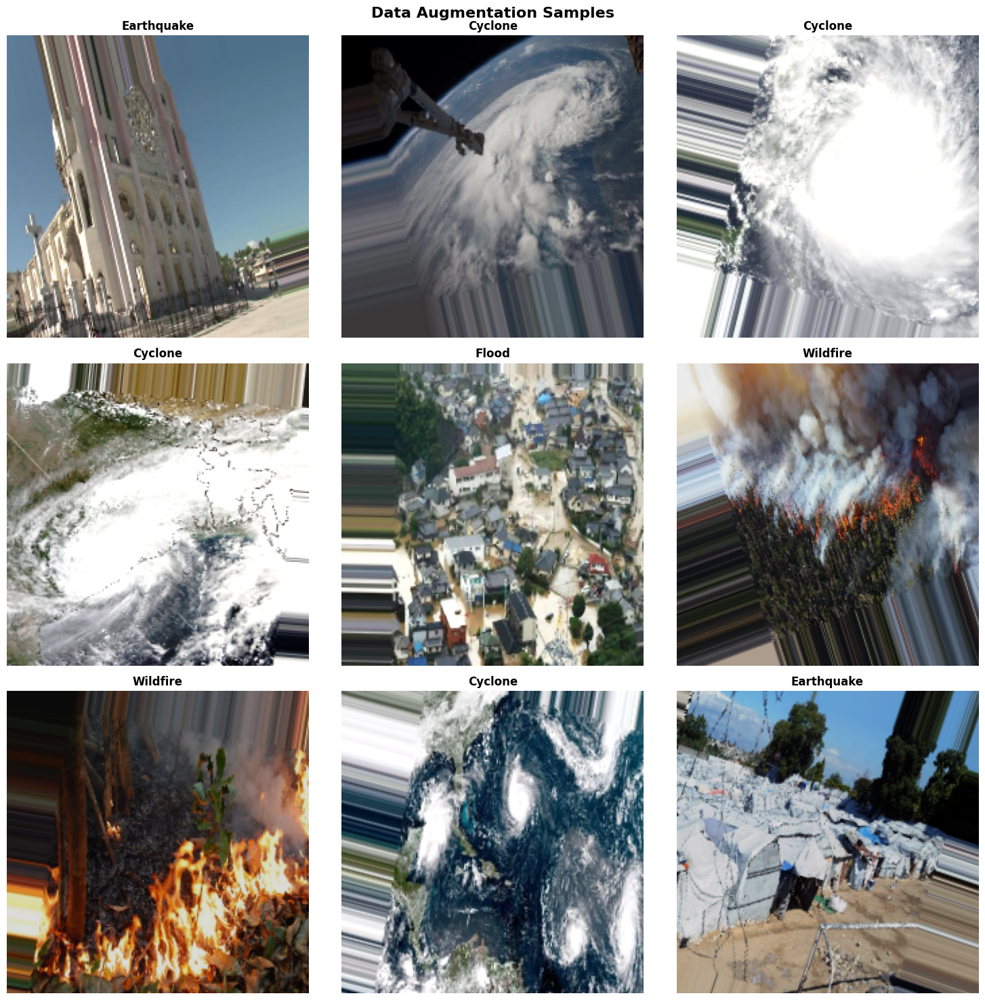

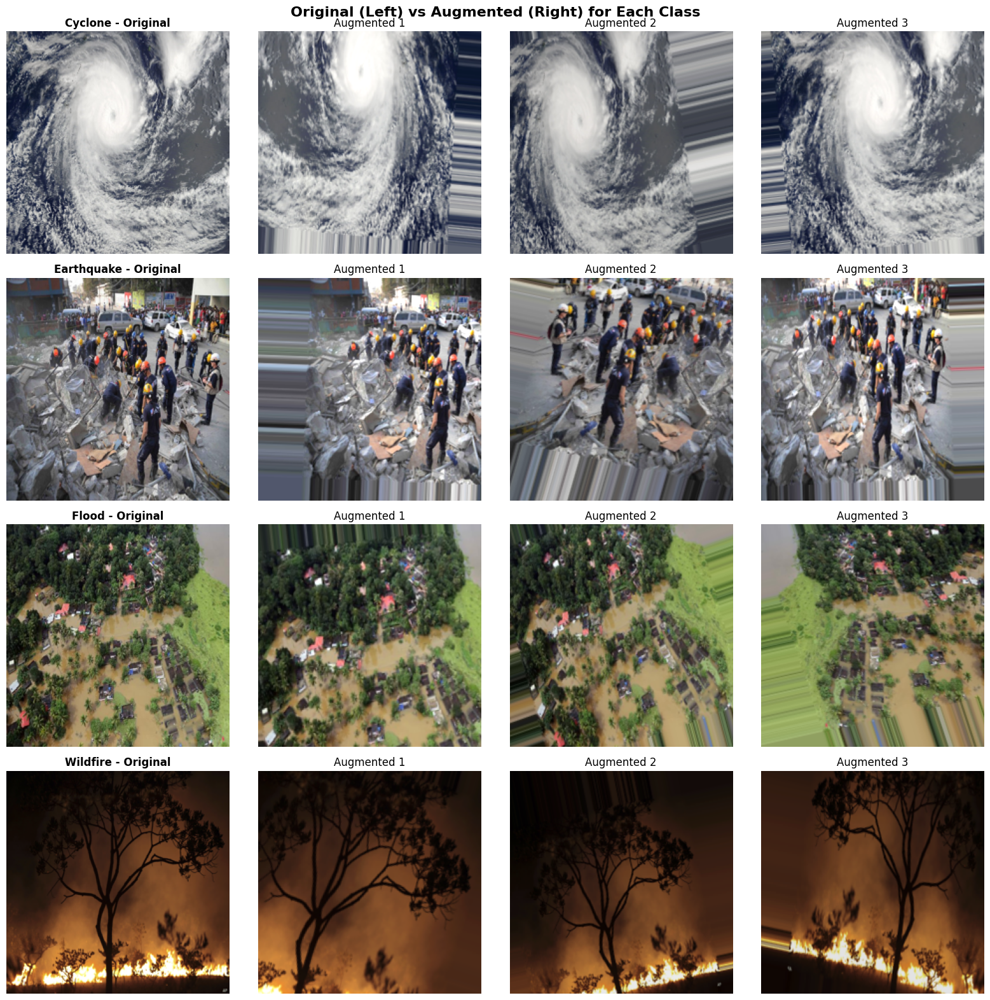


✅ Augmentation visualization complete!
📊 Generated files: augmentation_samples.png, class_augmentation_comparison.png

✅ DATA GENERATORS READY FOR TRAINING!

Use these generators:
  • train_gen - For training with augmentation
  • val_gen - For validation (no augmentation)
  • test_gen - For testing (no augmentation)

Next Step: Build EfficientNet model!


In [10]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.efficientnet import preprocess_input
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import os

# =============================================
# CONFIGURATION
# =============================================

BASE_PATH = "../Dataset"
TRAIN_DIR = os.path.join(BASE_PATH, 'train')
VAL_DIR = os.path.join(BASE_PATH, 'validation')
TEST_DIR = os.path.join(BASE_PATH, 'test')

IMG_SIZE = 224
BATCH_SIZE = 32
NUM_CLASSES = 4
CLASSES = ['cyclone', 'earthquake', 'flood', 'wildfire']

np.random.seed(42)
tf.random.set_seed(42)

# =============================================
# DATA GENERATORS (FOR TRAINING)
# =============================================

def create_data_generators():
    """Create data generators with augmentation for training"""
    
    train_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input,
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2],
    )
    
    val_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input
    )
    
    test_datagen = ImageDataGenerator(
        preprocessing_function=preprocess_input
    )
    
    train_generator = train_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )
    
    val_generator = val_datagen.flow_from_directory(
        VAL_DIR,
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )
    
    test_generator = test_datagen.flow_from_directory(
        TEST_DIR,
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=False
    )
    
    return train_generator, val_generator, test_generator

# =============================================
# FIXED VISUALIZATION (WITHOUT PREPROCESSING)
# =============================================

def visualize_augmentations_fixed(num_samples=9):
    """
    Visualize augmented images WITHOUT preprocessing for proper display
    """
    # Create augmentation generator WITHOUT preprocessing
    vis_datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2],
        rescale=1./255  # Only rescale for visualization
    )
    
    vis_generator = vis_datagen.flow_from_directory(
        TRAIN_DIR,
        target_size=(IMG_SIZE, IMG_SIZE),
        batch_size=BATCH_SIZE,
        class_mode='categorical',
        shuffle=True,
        seed=42
    )
    
    # Get a batch of images
    images, labels = next(vis_generator)
    
    # Create subplot
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    fig.suptitle('Data Augmentation Samples', fontsize=16, fontweight='bold')
    axes = axes.flatten()
    
    for i in range(min(num_samples, len(images))):
        img = images[i]
        
        # Get class label
        class_idx = np.argmax(labels[i])
        class_name = CLASSES[class_idx]
        
        # Display
        axes[i].imshow(img)
        axes[i].set_title(f'{class_name.capitalize()}', fontsize=12, fontweight='bold')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.savefig('augmentation_samples.png', dpi=150, bbox_inches='tight')
    plt.show()

def compare_original_vs_augmented_fixed():
    """
    Compare original and augmented versions - FIXED VERSION
    """
    # Load a sample image
    sample_class = 'cyclone'
    sample_dir = os.path.join(TRAIN_DIR, sample_class)
    sample_image = os.listdir(sample_dir)[0]
    sample_path = os.path.join(sample_dir, sample_image)
    
    # Load and preprocess original
    img = Image.open(sample_path)
    img_resized = img.resize((IMG_SIZE, IMG_SIZE))
    img_array = np.array(img_resized)
    
    # Create augmentation generator (WITHOUT preprocessing for visualization)
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.2,
        horizontal_flip=True,
        fill_mode='nearest',
        brightness_range=[0.8, 1.2],
    )
    
    # Generate augmented versions
    img_array_expanded = np.expand_dims(img_array, axis=0)
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    fig.suptitle(f'Original vs Augmented - {sample_class.capitalize()}', fontsize=16, fontweight='bold')
    
    # Show original
    axes[0, 0].imshow(img_resized)
    axes[0, 0].set_title('Original', fontsize=12, fontweight='bold')
    axes[0, 0].axis('off')
    
    # Generate and show 7 augmented versions
    aug_iter = datagen.flow(img_array_expanded, batch_size=1)
    
    positions = [(0, 1), (0, 2), (0, 3), (1, 0), (1, 1), (1, 2), (1, 3)]
    aug_names = ['Rotation + Shift', 'Zoom + Flip', 'Brightness', 'Shear', 
                 'Combined 1', 'Combined 2', 'Combined 3']
    
    for idx, (row, col) in enumerate(positions):
        aug_img = next(aug_iter)[0].astype('uint8')
        axes[row, col].imshow(aug_img)
        axes[row, col].set_title(aug_names[idx], fontsize=10)
        axes[row, col].axis('off')
    
    plt.tight_layout()
    plt.savefig('original_vs_augmented.png', dpi=150, bbox_inches='tight')
    plt.show()

# =============================================
# SIMPLE SIDE-BY-SIDE COMPARISON
# =============================================

def show_original_vs_augmented_simple():
    """Show 4 original images vs their augmented versions"""
    
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    fig.suptitle('Original (Left) vs Augmented (Right) for Each Class', fontsize=16, fontweight='bold')
    
    datagen = ImageDataGenerator(
        rotation_range=20,
        width_shift_range=0.2,
        height_shift_range=0.2,
        shear_range=0.15,
        zoom_range=0.2,
        horizontal_flip=True,
        brightness_range=[0.8, 1.2],
    )
    
    for i, class_name in enumerate(CLASSES):
        class_dir = os.path.join(TRAIN_DIR, class_name)
        sample_image = os.listdir(class_dir)[0]
        sample_path = os.path.join(class_dir, sample_image)
        
        # Load original
        img = Image.open(sample_path)
        img_resized = img.resize((IMG_SIZE, IMG_SIZE))
        img_array = np.array(img_resized)
        
        # Show original
        axes[i, 0].imshow(img_resized)
        axes[i, 0].set_title(f'{class_name.capitalize()} - Original', fontweight='bold')
        axes[i, 0].axis('off')
        
        # Generate 3 augmented versions
        img_array_expanded = np.expand_dims(img_array, axis=0)
        aug_iter = datagen.flow(img_array_expanded, batch_size=1)
        
        for j in range(3):
            aug_img = next(aug_iter)[0].astype('uint8')
            axes[i, j+1].imshow(aug_img)
            axes[i, j+1].set_title(f'Augmented {j+1}')
            axes[i, j+1].axis('off')
    
    plt.tight_layout()
    plt.savefig('class_augmentation_comparison.png', dpi=150, bbox_inches='tight')
    plt.show()

# =============================================
# MAIN EXECUTION
# =============================================

print("="*70)
print("DATA AUGMENTATION PIPELINE SETUP")
print("="*70)

print("\n📊 Configuration:")
print(f"  • Image Size: {IMG_SIZE}x{IMG_SIZE}")
print(f"  • Batch Size: {BATCH_SIZE}")
print(f"  • Number of Classes: {NUM_CLASSES}")
print(f"  • Classes: {', '.join(CLASSES)}")

print("\n🔄 Creating Data Generators...")

# Create generators for training
train_gen, val_gen, test_gen = create_data_generators()

print("\n✅ Generators Created Successfully!")
print(f"\nDataset Statistics:")
print(f"  • Training samples: {train_gen.samples}")
print(f"  • Validation samples: {val_gen.samples}")
print(f"  • Test samples: {test_gen.samples}")
print(f"  • Steps per epoch (train): {len(train_gen)}")
print(f"  • Steps per epoch (val): {len(val_gen)}")

print("\n📈 Class Indices Mapping:")
for class_name, class_idx in train_gen.class_indices.items():
    print(f"  • {class_name.capitalize()}: {class_idx}")

print("\n" + "="*70)
print("VISUALIZING AUGMENTATIONS (FIXED)")
print("="*70)

# Fixed visualizations
visualize_augmentations_fixed(num_samples=9)
show_original_vs_augmented_simple()

print("\n✅ Augmentation visualization complete!")
print("📊 Generated files: augmentation_samples.png, class_augmentation_comparison.png")

print("\n" + "="*70)
print("✅ DATA GENERATORS READY FOR TRAINING!")
print("="*70)
print("\nUse these generators:")
print("  • train_gen - For training with augmentation")
print("  • val_gen - For validation (no augmentation)")
print("  • test_gen - For testing (no augmentation)")
print("\nNext Step: Build EfficientNet model!")



🔨 Building ResNet50 Model with ImageNet weights...
✅ ResNet50 model built with ImageNet weights!
Total parameters: 24,779,396

🚀 STARTING ENHANCED TRAINING WITH OVERFITTING DETECTION

PHASE 1: Training Classifier Head (Base Model Frozen)
Epoch 1/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 769ms/step - accuracy: 0.7619 - auc: 0.9173 - loss: 0.6662 - precision: 0.8023 - recall: 0.7379
Epoch 1: val_accuracy improved from None to 0.94500, saving model to model/disaster_model_phase1_best.keras
50/50 ━━━━━━━━━━━━━━━━━━━━ 55s 1s/step - accuracy: 0.8569 - auc: 0.9714 - loss: 0.4198 - precision: 0.8782 - recall: 0.8469 - val_accuracy: 0.9450 - val_auc: 0.9913 - val_loss: 0.1791 - val_precision: 0.9566 - val_recall: 0.9375 - learning_rate: 0.0010
Epoch 2/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 782ms/step - accuracy: 0.9201 - auc: 0.9883 - loss: 0.2374 - precision: 0.9247 - recall: 0.9158
Epoch 2: val_accuracy improved from 0.94500 to 0.95250, saving model to model/disaster_model_phase1_best.keras
50/50 ━━━━━━━━━

/tmp/ipykernel_10215/4173111013.py:323: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_10215/4173111013.py:324: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  plt.savefig('model/training_history_enhanced.png', dpi=150, bbox_inches='tight')
/home/sushi/Desktop/Disaster-classifier/venv/lib/python3.12/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 9989 (\N{WHITE HEAVY CHECK MARK}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


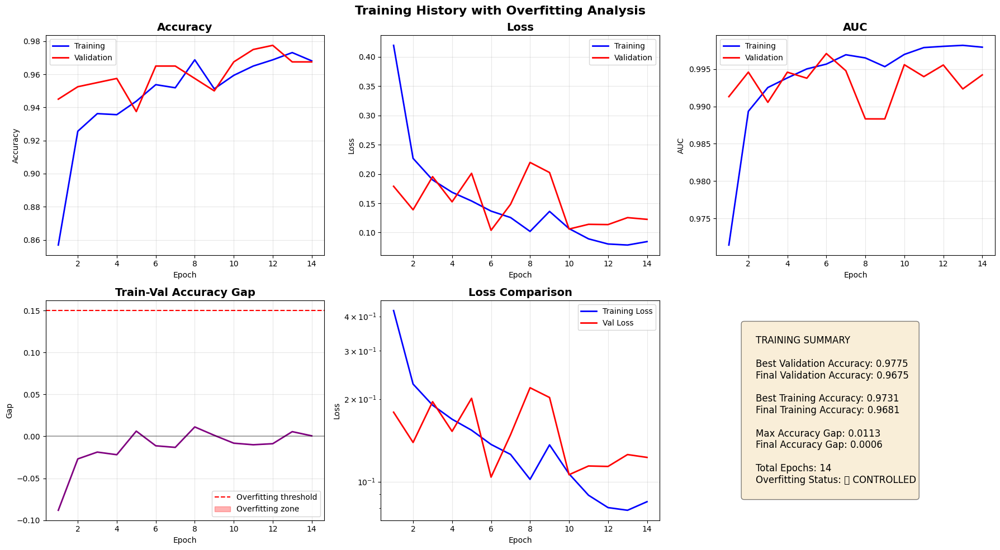

ValueError: Invalid filepath extension for saving. Please add either a `.keras` extension for the native Keras format (recommended) or a `.h5` extension. Use `model.export(filepath)` if you want to export a SavedModel for use with TFLite/TFServing/etc. Received: filepath=model/disaster_model_savedmodel.

In [21]:
import os
import json
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, TensorBoard
import matplotlib.pyplot as plt
import numpy as np

# Configuration
MODEL_NAME = 'disaster_model'
IMG_SIZE = 224
NUM_CLASSES = 4
CLASSES = ['cyclone', 'earthquake', 'flood', 'wildfire']

# =============================================
# BUILD MODEL FIRST
# =============================================

from tensorflow.keras.applications import ResNet50

print("\n🔨 Building ResNet50 Model with ImageNet weights...")

base_model = ResNet50(
    include_top=False,
    weights='imagenet',  # This WILL work
    input_shape=(IMG_SIZE, IMG_SIZE, 3)
)

base_model.trainable = False

inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))
x = base_model(inputs, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(512, activation='relu')(x)
x = layers.BatchNormalization()(x)
x = layers.Dropout(0.3)(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.2)(x)
outputs = layers.Dense(NUM_CLASSES, activation='softmax')(x)

model = models.Model(inputs, outputs)

print("✅ ResNet50 model built with ImageNet weights!")
print(f"Total parameters: {model.count_params():,}")

# =============================================
# OVERFITTING MONITOR CALLBACK
# =============================================

class OverfittingMonitor(keras.callbacks.Callback):
    """Custom callback to detect and stop training when overfitting occurs"""
    
    def __init__(self, threshold=0.1, patience=3):
        super().__init__()
        self.threshold = threshold
        self.patience = patience
        self.overfit_count = 0
        self.best_val_loss = float('inf')
        
    def on_epoch_end(self, epoch, logs=None):
        train_acc = logs.get('accuracy')
        val_acc = logs.get('val_accuracy')
        val_loss = logs.get('val_loss')
        
        if train_acc is None or val_acc is None:
            return
        
        acc_gap = train_acc - val_acc
        
        if acc_gap > self.threshold:
            self.overfit_count += 1
            print(f"\n⚠️ Overfitting detected! Train-Val accuracy gap: {acc_gap:.4f}")
            
            if self.overfit_count >= self.patience:
                print(f"\n🛑 Stopping training: Persistent overfitting detected for {self.patience} epochs")
                self.model.stop_training = True
        else:
            self.overfit_count = 0
        
        if val_loss is not None and val_loss < self.best_val_loss:
            self.best_val_loss = val_loss

def create_enhanced_callbacks(model_name='disaster_model', monitor_overfitting=True):
    """Create enhanced training callbacks with overfitting detection"""
    
    os.makedirs('model', exist_ok=True)
    os.makedirs('logs', exist_ok=True)
    
    callbacks = [
        ModelCheckpoint(
            filepath=f'model/{model_name}_best.keras',
            monitor='val_accuracy',
            mode='max',
            save_best_only=True,
            verbose=1
        ),
        EarlyStopping(
            monitor='val_loss',
            patience=8,
            restore_best_weights=True,
            verbose=1,
            mode='min'
        ),
        ReduceLROnPlateau(
            monitor='val_loss',
            factor=0.5,
            patience=4,
            min_lr=1e-7,
            verbose=1,
            mode='min'
        ),
        TensorBoard(
            log_dir=f'logs/{model_name}',
            histogram_freq=1,
            write_graph=True
        )
    ]
    
    if monitor_overfitting:
        callbacks.append(
            OverfittingMonitor(threshold=0.15, patience=3)
        )
    
    return callbacks

# =============================================
# ENHANCED TRAINING FUNCTION
# =============================================

def train_model_enhanced(model, base_model, train_gen, val_gen,
                        epochs_phase1=25, epochs_phase2=35):
    """Enhanced two-phase training with overfitting detection"""
    
    print("\n" + "="*70)
    print("PHASE 1: Training Classifier Head (Base Model Frozen)")
    print("="*70)
    
    base_model.trainable = False
    
    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-3),
        loss='categorical_crossentropy',
        metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                 tf.keras.metrics.Precision(name='precision'),
                 tf.keras.metrics.Recall(name='recall')]
    )
    
    history_phase1 = model.fit(
        train_gen,
        validation_data=val_gen,
        epochs=epochs_phase1,
        callbacks=create_enhanced_callbacks(f'{MODEL_NAME}_phase1', monitor_overfitting=True),
        verbose=1
    )
    
    final_train_acc = history_phase1.history['accuracy'][-1]
    final_val_acc = history_phase1.history['val_accuracy'][-1]
    
    print(f"\n📊 Phase 1 Results:")
    print(f"  • Final Training Accuracy: {final_train_acc:.4f}")
    print(f"  • Final Validation Accuracy: {final_val_acc:.4f}")
    print(f"  • Accuracy Gap: {final_train_acc - final_val_acc:.4f}")
    
    if final_val_acc < 0.70:
        print("\n" + "="*70)
        print("PHASE 2: Fine-tuning Top Layers")
        print("="*70)
        
        base_model.trainable = True
        freeze_until = len(base_model.layers) - 50
        
        for layer in base_model.layers[:freeze_until]:
            layer.trainable = False
        
        trainable_count = len([l for l in base_model.layers if l.trainable])
        print(f"Unfrozen {trainable_count}/{len(base_model.layers)} layers in base model")
        
        model.compile(
            optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
            loss='categorical_crossentropy',
            metrics=['accuracy', tf.keras.metrics.AUC(name='auc'),
                     tf.keras.metrics.Precision(name='precision'),
                     tf.keras.metrics.Recall(name='recall')]
        )
        
        print("Reduced learning rate to 1e-5 for fine-tuning")
        print("="*70)
        
        history_phase2 = model.fit(
            train_gen,
            validation_data=val_gen,
            epochs=epochs_phase2,
            initial_epoch=len(history_phase1.history['loss']),
            callbacks=create_enhanced_callbacks(f'{MODEL_NAME}_phase2', monitor_overfitting=True),
            verbose=1
        )
        
        final_train_acc = history_phase2.history['accuracy'][-1]
        final_val_acc = history_phase2.history['val_accuracy'][-1]
        
        print(f"\n📊 Phase 2 Results:")
        print(f"  • Final Training Accuracy: {final_train_acc:.4f}")
        print(f"  • Final Validation Accuracy: {final_val_acc:.4f}")
        print(f"  • Accuracy Gap: {final_train_acc - final_val_acc:.4f}")
        
    else:
        print("\n✅ Phase 1 achieved good performance. Skipping Phase 2.")
        history_phase2 = None
    
    return model, history_phase1, history_phase2

# =============================================
# ENHANCED VISUALIZATION
# =============================================

def plot_training_history_enhanced(history_phase1, history_phase2=None):
    """Enhanced visualization with overfitting indicators"""
    
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('Training History with Overfitting Analysis', fontsize=16, fontweight='bold')
    
    if history_phase2:
        train_acc = history_phase1.history['accuracy'] + history_phase2.history['accuracy']
        val_acc = history_phase1.history['val_accuracy'] + history_phase2.history['val_accuracy']
        train_loss = history_phase1.history['loss'] + history_phase2.history['loss']
        val_loss = history_phase1.history['val_loss'] + history_phase2.history['val_loss']
        train_auc = history_phase1.history['auc'] + history_phase2.history['auc']
        val_auc = history_phase1.history['val_auc'] + history_phase2.history['val_auc']
        phase_split = len(history_phase1.history['loss'])
    else:
        train_acc = history_phase1.history['accuracy']
        val_acc = history_phase1.history['val_accuracy']
        train_loss = history_phase1.history['loss']
        val_loss = history_phase1.history['val_loss']
        train_auc = history_phase1.history['auc']
        val_auc = history_phase1.history['val_auc']
        phase_split = None
    
    epochs = range(1, len(train_acc) + 1)
    
    # Plot 1: Accuracy
    axes[0, 0].plot(epochs, train_acc, 'b-', label='Training', linewidth=2)
    axes[0, 0].plot(epochs, val_acc, 'r-', label='Validation', linewidth=2)
    if phase_split:
        axes[0, 0].axvline(x=phase_split, color='green', linestyle='--', label='Fine-tuning starts')
    axes[0, 0].set_title('Accuracy', fontsize=14, fontweight='bold')
    axes[0, 0].set_xlabel('Epoch')
    axes[0, 0].set_ylabel('Accuracy')
    axes[0, 0].legend()
    axes[0, 0].grid(True, alpha=0.3)
    
    # Plot 2: Loss
    axes[0, 1].plot(epochs, train_loss, 'b-', label='Training', linewidth=2)
    axes[0, 1].plot(epochs, val_loss, 'r-', label='Validation', linewidth=2)
    if phase_split:
        axes[0, 1].axvline(x=phase_split, color='green', linestyle='--', label='Fine-tuning starts')
    axes[0, 1].set_title('Loss', fontsize=14, fontweight='bold')
    axes[0, 1].set_xlabel('Epoch')
    axes[0, 1].set_ylabel('Loss')
    axes[0, 1].legend()
    axes[0, 1].grid(True, alpha=0.3)
    
    # Plot 3: AUC
    axes[0, 2].plot(epochs, train_auc, 'b-', label='Training', linewidth=2)
    axes[0, 2].plot(epochs, val_auc, 'r-', label='Validation', linewidth=2)
    if phase_split:
        axes[0, 2].axvline(x=phase_split, color='green', linestyle='--', label='Fine-tuning starts')
    axes[0, 2].set_title('AUC', fontsize=14, fontweight='bold')
    axes[0, 2].set_xlabel('Epoch')
    axes[0, 2].set_ylabel('AUC')
    axes[0, 2].legend()
    axes[0, 2].grid(True, alpha=0.3)
    
    # Plot 4: Overfitting Gap
    acc_gap = [t - v for t, v in zip(train_acc, val_acc)]
    axes[1, 0].plot(epochs, acc_gap, 'purple', linewidth=2)
    axes[1, 0].axhline(y=0.15, color='red', linestyle='--', label='Overfitting threshold')
    axes[1, 0].axhline(y=0, color='black', linestyle='-', alpha=0.3)
    if phase_split:
        axes[1, 0].axvline(x=phase_split, color='green', linestyle='--', label='Fine-tuning starts')
    axes[1, 0].fill_between(epochs, 0, acc_gap, where=[g > 0.15 for g in acc_gap],
                            color='red', alpha=0.3, label='Overfitting zone')
    axes[1, 0].set_title('Train-Val Accuracy Gap', fontsize=14, fontweight='bold')
    axes[1, 0].set_xlabel('Epoch')
    axes[1, 0].set_ylabel('Gap')
    axes[1, 0].legend()
    axes[1, 0].grid(True, alpha=0.3)
    
    # Plot 5: Loss Comparison
    axes[1, 1].plot(epochs, train_loss, 'b-', linewidth=2, label='Training Loss')
    axes[1, 1].plot(epochs, val_loss, 'r-', linewidth=2, label='Val Loss')
    axes[1, 1].set_title('Loss Comparison', fontsize=14, fontweight='bold')
    axes[1, 1].set_xlabel('Epoch')
    axes[1, 1].set_ylabel('Loss')
    axes[1, 1].legend()
    axes[1, 1].set_yscale('log')
    axes[1, 1].grid(True, alpha=0.3)
    
    # Plot 6: Summary
    axes[1, 2].axis('off')
    summary_text = f"""
    TRAINING SUMMARY
    
    Best Validation Accuracy: {max(val_acc):.4f}
    Final Validation Accuracy: {val_acc[-1]:.4f}
    
    Best Training Accuracy: {max(train_acc):.4f}
    Final Training Accuracy: {train_acc[-1]:.4f}
    
    Max Accuracy Gap: {max(acc_gap):.4f}
    Final Accuracy Gap: {acc_gap[-1]:.4f}
    
    Total Epochs: {len(epochs)}
    Overfitting Status: {'⚠️ DETECTED' if max(acc_gap) > 0.15 else '✅ CONTROLLED'}
    """
    axes[1, 2].text(0.1, 0.5, summary_text, fontsize=12, verticalalignment='center',
                   bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
    
    plt.tight_layout()
    plt.savefig('model/training_history_enhanced.png', dpi=150, bbox_inches='tight')
    plt.show()

# =============================================
# START TRAINING
# =============================================

print("\n" + "="*70)
print("🚀 STARTING ENHANCED TRAINING WITH OVERFITTING DETECTION")
print("="*70)

trained_model, hist1, hist2 = train_model_enhanced(
    model, 
    base_model, 
    train_gen, 
    val_gen,
    epochs_phase1=25,
    epochs_phase2=35
)

plot_training_history_enhanced(hist1, hist2)

# =============================================
# SAVE FOR DEPLOYMENT
# =============================================

os.makedirs("model", exist_ok=True)
os.makedirs("config", exist_ok=True)

trained_model.save("model/disaster_model_savedmodel")

model_info = {
    "classes": CLASSES,
    "input_shape": [IMG_SIZE, IMG_SIZE, 3],
    "best_val_acc": float(max(hist1.history['val_accuracy'] + (hist2.history['val_accuracy'] if hist2 else [])))
}

with open("config/model_info.json", "w") as f:
    json.dump(model_info, f, indent=2)

print("\n" + "="*70)
print("✅ TRAINING COMPLETE!")
print("="*70)
print("\n📦 Deployment Artifacts:")
print("  • model/disaster_model_savedmodel/ (load for deployment)")
print("  • config/model_info.json (class names & config)")
print("  • model/training_history_enhanced.png (training visualization)")
print("\n🚀 Ready for Flask deployment!")


In [22]:
# =============================================
# SAVE FOR DEPLOYMENT
# =============================================

os.makedirs("model", exist_ok=True)
os.makedirs("config", exist_ok=True)

# Use .export() for SavedModel format (Keras 3 requirement)
trained_model.export("model/disaster_model_savedmodel")

# Also save as .keras for backup
trained_model.save("model/disaster_model.keras")

# Save model info
model_info = {
    "classes": CLASSES,
    "input_shape": [IMG_SIZE, IMG_SIZE, 3],
    "best_val_acc": float(max(hist1.history['val_accuracy'] + (hist2.history['val_accuracy'] if hist2 else [])))
}

with open("config/model_info.json", "w") as f:
    json.dump(model_info, f, indent=2)

print("\n" + "="*70)
print("✅ TRAINING COMPLETE!")
print("="*70)
print("\n📦 Deployment Artifacts:")
print("  • model/disaster_model_savedmodel/ (for TF Serving/deployment)")
print("  • model/disaster_model.keras (native Keras format)")
print("  • config/model_info.json (class names & config)")
print("  • model/training_history_enhanced.png (training visualization)")
print("\n🚀 Ready for Flask deployment!")


INFO:tensorflow:Assets written to: model/disaster_model_savedmodel/assets


INFO:tensorflow:Assets written to: model/disaster_model_savedmodel/assets


Saved artifact at 'model/disaster_model_savedmodel'. The following endpoints are available:

* Endpoint 'serve'
  args_0 (POSITIONAL_ONLY): TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name='keras_tensor_665')
Output Type:
  TensorSpec(shape=(None, 4), dtype=tf.float32, name=None)
Captures:
  130989414115920: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414116688: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414117072: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414117264: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414116880: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414116112: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414118032: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414115344: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414114768: TensorSpec(shape=(), dtype=tf.resource, name=None)
  130989414119568: TensorSpec(shape=(), dtype=tf.resource, name=Non


✅ Loaded model and configuration successfully!
Classes: ['cyclone', 'earthquake', 'flood', 'wildfire']
Image size: 224x224
Found 400 images belonging to 4 classes.

🧠 Starting model evaluation...


/home/sushi/Desktop/Disaster-classifier/venv/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


13/13 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step - accuracy: 0.8775 - auc: 0.9602 - loss: 0.6581 - precision: 0.8797 - recall: 0.8775

📊 Test Metrics:
  • Accuracy:  87.75%
  • AUC:       0.9602
  • Precision: 0.8797
  • Recall:    0.8775
  • Loss:      0.6581

🔍 Generating classification report...
13/13 ━━━━━━━━━━━━━━━━━━━━ 16s 1s/step

📋 Classification Report:
              precision    recall  f1-score   support

     cyclone       0.93      0.88      0.90       100
  earthquake       0.82      0.97      0.89       100
       flood       0.97      0.75      0.85       100
    wildfire       0.83      0.91      0.87       100

    accuracy                           0.88       400
   macro avg       0.89      0.88      0.88       400
weighted avg       0.89      0.88      0.88       400



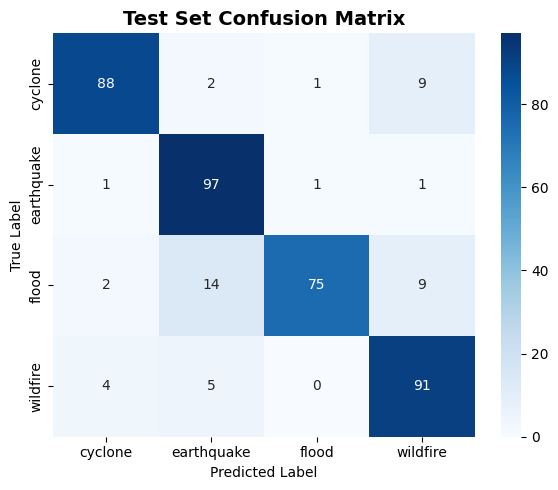


✅ Evaluation complete! Confusion matrix saved as 'model/test_confusion_matrix.png'


In [5]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.resnet import preprocess_input
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import os

# =============================================
# LOAD MODEL AND CONFIG
# =============================================
model = tf.keras.models.load_model("model/disaster_model.keras")

with open("config/model_info.json", "r") as f:
    info = json.load(f)
CLASSES = info["classes"]
IMG_SIZE = info["input_shape"][0]

print("\n✅ Loaded model and configuration successfully!")
print(f"Classes: {CLASSES}")
print(f"Image size: {IMG_SIZE}x{IMG_SIZE}")

# =============================================
# LOAD TEST DATASET (Using same preprocessing as training)
# =============================================
test_dir = os.path.join("Dataset", "test")  # Adjust automatically for your setup
if not os.path.exists(test_dir):
    test_dir = os.path.join("..", "Dataset", "test")  # fallback if one level above

test_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)

test_gen = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=32,
    class_mode='categorical',
    classes=CLASSES,  # Force same class order as training
    shuffle=False
)

print("\n🧠 Starting model evaluation...")

# =============================================
# MODEL EVALUATION
# =============================================
loss, accuracy, auc, precision, recall = model.evaluate(test_gen)
print("\n📊 Test Metrics:")
print(f"  • Accuracy:  {accuracy*100:.2f}%")
print(f"  • AUC:       {auc:.4f}")
print(f"  • Precision: {precision:.4f}")
print(f"  • Recall:    {recall:.4f}")
print(f"  • Loss:      {loss:.4f}")

# =============================================
# PREDICTIONS & REPORTS
# =============================================
print("\n🔍 Generating classification report...")
y_true = test_gen.classes
y_pred = model.predict(test_gen, verbose=1)
y_pred_classes = np.argmax(y_pred, axis=1)

print("\n📋 Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=CLASSES))

# =============================================
# CONFUSION MATRIX VISUALIZATION
# =============================================
cm = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=CLASSES, yticklabels=CLASSES)
plt.title("Test Set Confusion Matrix", fontsize=14, fontweight="bold")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.tight_layout()

os.makedirs("model", exist_ok=True)
plt.savefig("model/test_confusion_matrix.png", dpi=150)
plt.show()

print("\n✅ Evaluation complete! Confusion matrix saved as 'model/test_confusion_matrix.png'")
